# Investigating ARM Scanning Cloud Radar Data from EPCAPE

## Motivation



## The Problem

We would like to find data from a relevant case, and visualize using Py-ART!

## The Solution
Include a walk through of the solution, with some sort of final figure or notable insight!

### Searching for data through the DQ Plot Browser
We do not know exactly what date/time we would like to analyze! Instead of downloading the entire record, making our own visualizations, and deciding on an analysis time from there, we can utilize a tool provided by ARM - the Data Quality quicklooks!

These are automated plots that are generated for a variety of ARM instruments - including the scanning radars!

We filled out the query using the following link, adding in which specific instrument we are interested in, and a general time frame. We know that January 2024 was the wettest January on record for La Jolla, California, so we can use that as a time frame to find an event!

![dq plot browser epcape](../images/dq-browser-epcape.png)

[Link to access this in your browser](https://dq.arm.gov/dq-plotbrowser/?comp=true&s=epc&c=kasacr&f=S2&l=a1&p=ppiv&p=rhi&sd=20240101&ed=20240131&)

### Use ACT to retrieve data from EPCAPE

In [101]:
import glob
import tarfile

import act
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pyart
import matplotlib.pyplot as plt
import numpy as np

#### Retrieve you API token from ARM Live
You will need to go to ARM Live to access your individual token. Follow [this link](https://adc.arm.gov/armlive/livedata/home), or it is accessible through the documentation for the `download_arm_data` function from the Atmospheric data Community Toolkit (ACT).

In [105]:
?act.discovery.download_arm_data

Signature:
act.discovery.download_arm_data(
    username,
    token,
    datastream,
    startdate,
    enddate,
    time=None,
    output=None,
)
Docstring:
This tool will help users utilize the ARM Live Data Webservice to download
ARM data.

Parameters
----------
username : str
    The username to use for logging into the ADC archive.
token : str
    The access token for accessing the ADC archive.
datastream : str
    The name of the datastream to acquire.
startdate : str
    The start date of the data to acquire. Formats accepted are
    YYYY-MM-DD, DD.MM.YYYY, DD/MM/YYYY, YYYYMMDD, YYYY/MM/DD or
    any of the previous formats with THH:MM:SS added onto the end
    (ex. 2020-09-15T12:00:00).
enddate : str
    The end date of the data to acquire. Formats accepted are
    YYYY-MM-DD, DD.MM.YYYY, DD/MM/YYYY, YYYYMMDD or YYYY/MM/DD, or
    any of the previous formats with THH:MM:SS added onto the end
    (ex. 2020-09-15T13:00:00).
time: str or None
    The specific time. Format is HHMMS

#### Pass your Credentials into the Search
Use your ARM username and token in the following cell to search and download your data!

In [2]:
username = "USERNAME"
token = "TOKEN"
datastream = "epckasacrcfrS2.a1"
startdate = "2024-01-21T01:00:00"
enddate = "2024-01-21T01:30:00"

In [4]:
files = act.discovery.download_arm_data(username, token, datastream, startdate, enddate)

[DOWNLOADING] epckasacrcfrS2.a1.20240121.010020.nc
[DOWNLOADING] epckasacrcfrS2.a1.20240121.010436.nc
[DOWNLOADING] epckasacrcfrS2.a1.20240121.011116.nc
[DOWNLOADING] epckasacrcfrS2.a1.20240121.012914.nc
[DOWNLOADING] epckasacrcfrS2.a1.20240121.012503.nc
[DOWNLOADING] epckasacrcfrS2.a1.20240121.011845.nc
[DOWNLOADING] epckasacrcfrS2.a1.20240121.012257.nc
[DOWNLOADING] epckasacrcfrS2.a1.20240121.010757.nc
[DOWNLOADING] epckasacrcfrS2.a1.20240121.010118.nc
[DOWNLOADING] epckasacrcfrS2.a1.20240121.011434.nc
[DOWNLOADING] epckasacrcfrS2.a1.20240121.012708.nc
[DOWNLOADING] epckasacrcfrS2.a1.20240121.011640.nc
[DOWNLOADING] epckasacrcfrS2.a1.20240121.012051.nc

If you use these data to prepare a publication, please cite:

Bharadwaj, N., Hardin, J., Isom, B., Johnson, K., Lindenmaier, I., Matthews, A.,
Nelson, D., Feng, Y.-C., Deng, M., Rocque, M., Castro, V., & Wendler, T. Ka-Band
Scanning ARM Cloud Radar (KASACRCFR). Atmospheric Radiation Measurement (ARM)
User Facility. https://doi.org/10.

### Read the Data into Py-ART
Now that we have a directory full of files, we can read these into Py-ART. The trick is figuring out which ones we are interested in.

In [3]:
files = sorted(glob.glob("epckasacrcfrS2.a1/*"))

#### Take a Peak at the Scan Strategy
Each of these radar volumes had a different scan strategy. We can check this within the radar's metadata!

In [4]:
radar = pyart.io.read(files[0])

/Users/mgrover/mambaforge/envs/pyart-dev/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


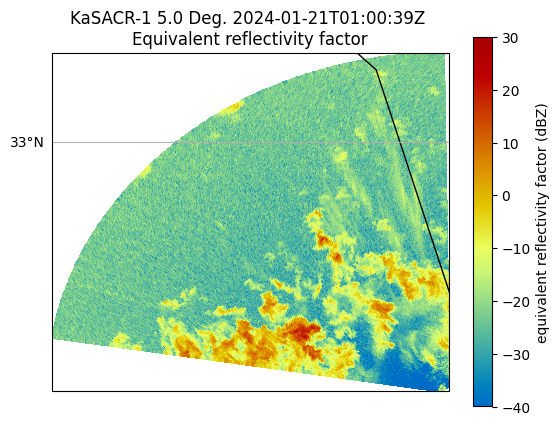

In [5]:
display = pyart.graph.RadarMapDisplay(radar)
display.plot_ppi_map(
    "reflectivity", sweep=1, vmin=-40, vmax=30, projection=ccrs.PlateCarree()
)

This information is stored in the `scan_type` attribute!

In [6]:
radar.scan_type

'ppi'

We can check the scan types for all of the radar files we downloaded!

In [7]:
for file in files:
    radar = pyart.io.read(file)
    print(f"{file} has {radar.scan_type} scan strategy!")

epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.010020.nc has ppi scan strategy!
epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.010118.nc has rhi scan strategy!
epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.010436.nc has rhi scan strategy!
epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.010757.nc has rhi scan strategy!
epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.011116.nc has rhi scan strategy!
epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.011434.nc has ppi scan strategy!
epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.011640.nc has ppi scan strategy!
epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.011845.nc has ppi scan strategy!
epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.012051.nc has ppi scan strategy!
epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.012257.nc has ppi scan strategy!
epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.012503.nc has ppi scan strategy!
epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.012708.nc has ppi scan strategy!
epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.012914.nc has ppi s

#### Sort the Scans by Scan Strategy
Now that we know which file has whic can strategy, we can sort them into `ppi` and `rhi` categories!

In [8]:
ppi_files = []
rhi_files = []
for file in files:
    radar = pyart.io.read(file)

    if radar.scan_type == "ppi":
        ppi_files.append(file)

    elif radar.scan_type == "rhi":
        rhi_files.append(file)

    else:
        print(f"{file} is not a PPI or RHI scan")

In [9]:
print(f"RHI Files: {rhi_files}")
print(f"PPI Files: {ppi_files}")

RHI Files: ['epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.010118.nc', 'epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.010436.nc', 'epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.010757.nc', 'epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.011116.nc']
PPI Files: ['epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.010020.nc', 'epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.011434.nc', 'epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.011640.nc', 'epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.011845.nc', 'epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.012051.nc', 'epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.012257.nc', 'epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.012503.nc', 'epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.012708.nc', 'epckasacrcfrS2.a1/epckasacrcfrS2.a1.20240121.012914.nc']


#### Plot all of the PPI Scans

/Users/mgrover/mambaforge/envs/pyart-dev/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


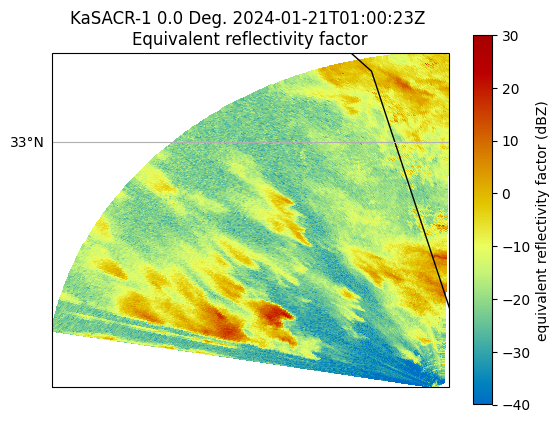

/Users/mgrover/mambaforge/envs/pyart-dev/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


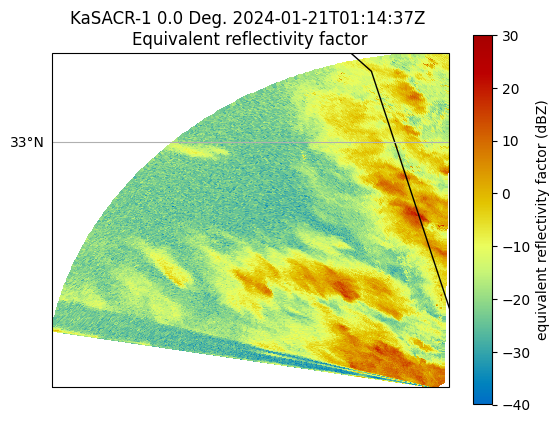

/Users/mgrover/mambaforge/envs/pyart-dev/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


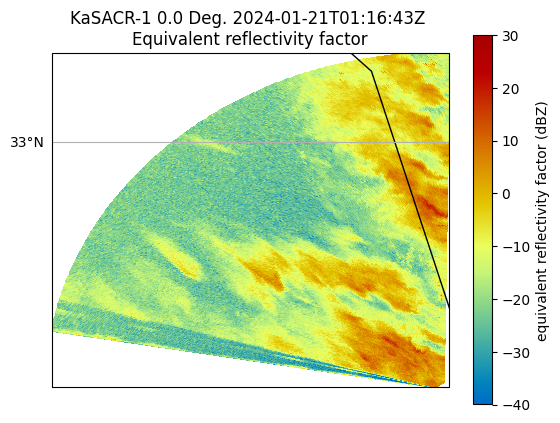

/Users/mgrover/mambaforge/envs/pyart-dev/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


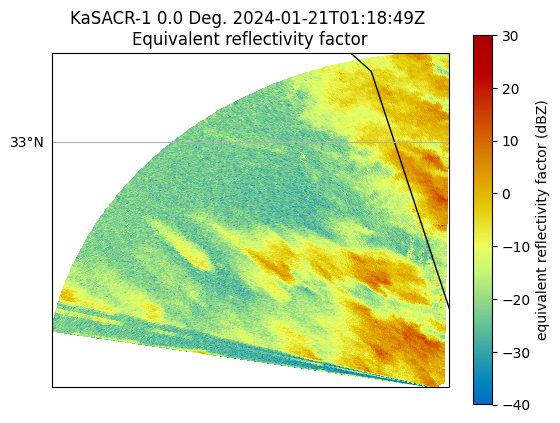

/Users/mgrover/mambaforge/envs/pyart-dev/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


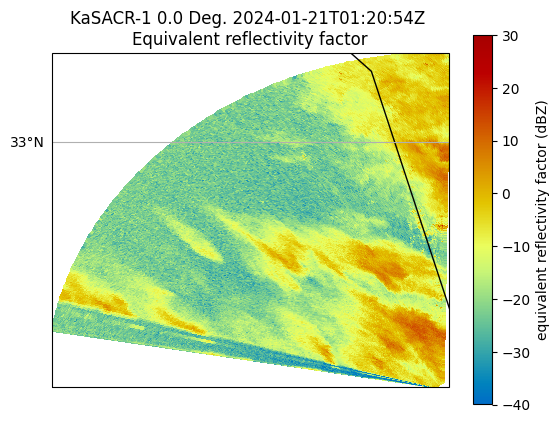

/Users/mgrover/mambaforge/envs/pyart-dev/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


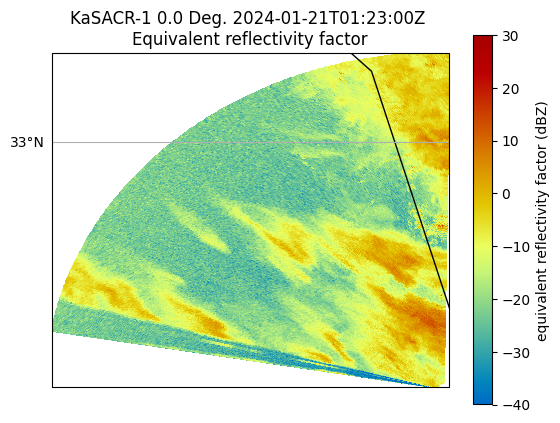

/Users/mgrover/mambaforge/envs/pyart-dev/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


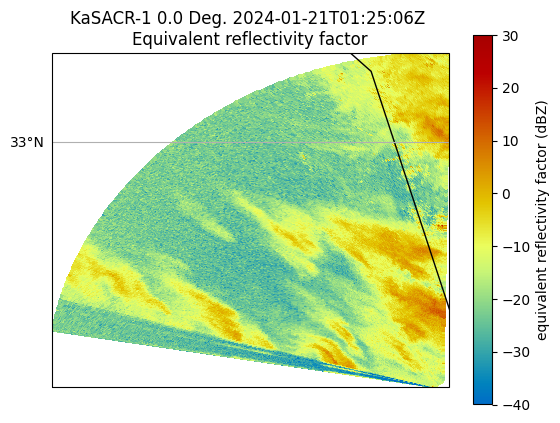

/Users/mgrover/mambaforge/envs/pyart-dev/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


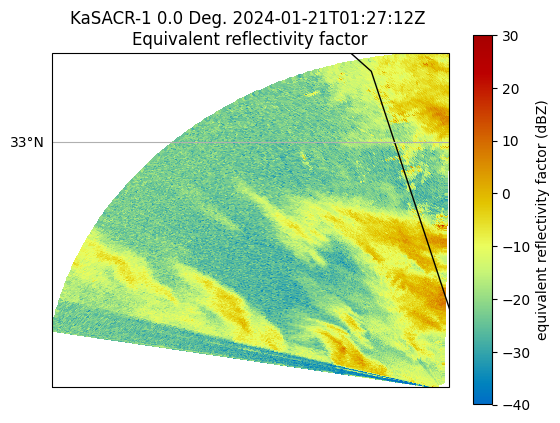

/Users/mgrover/mambaforge/envs/pyart-dev/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


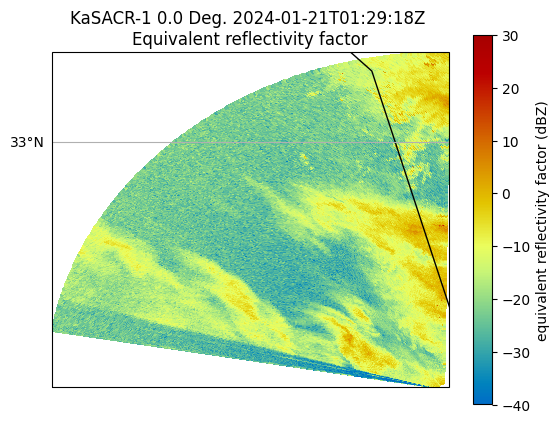

In [54]:
for file in ppi_files:
    radar = pyart.io.read(file)
    display = pyart.graph.RadarMapDisplay(radar)
    display.plot_ppi_map(
        "reflectivity", sweep=0, vmin=-40, vmax=30, projection=ccrs.PlateCarree()
    )
    plt.show()
    plt.close()

#### Plot all the RHI Scans

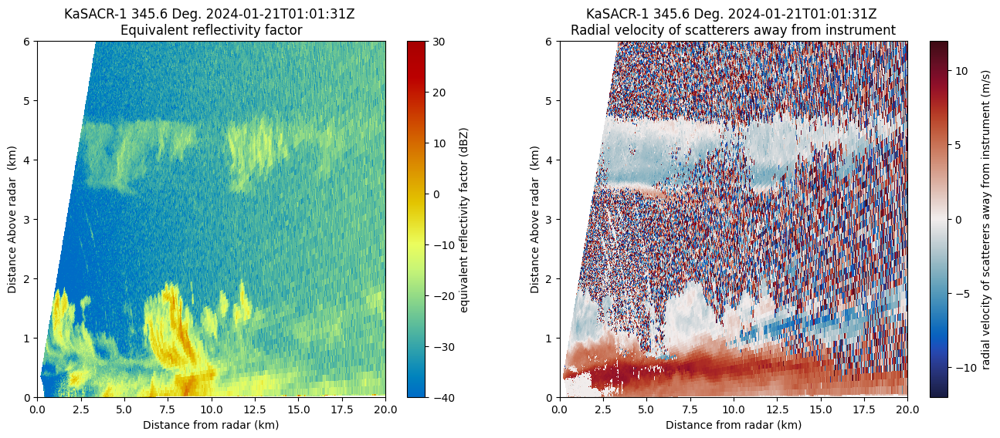

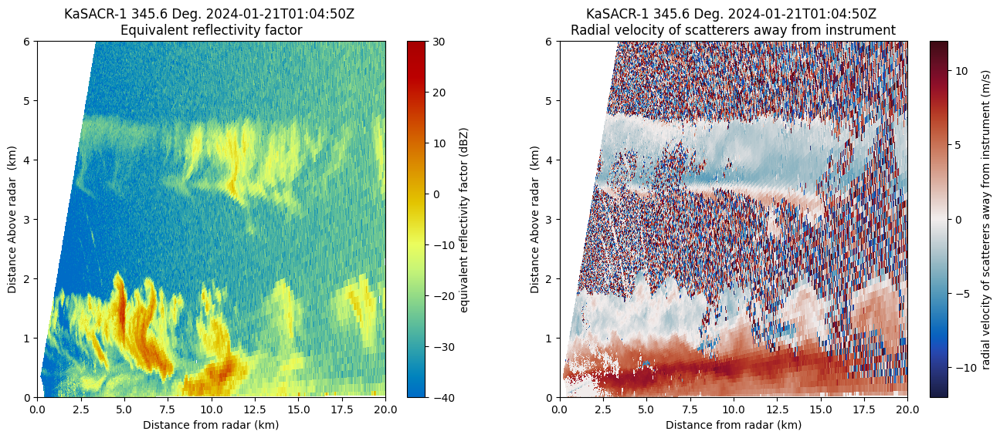

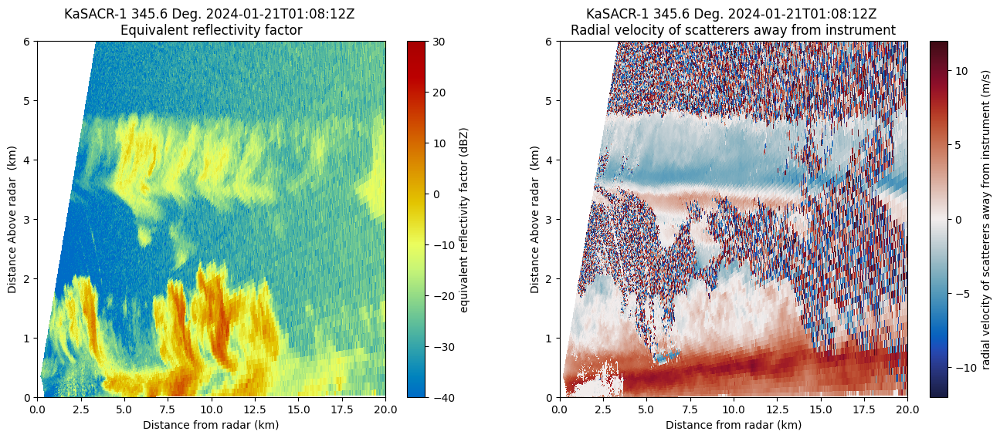

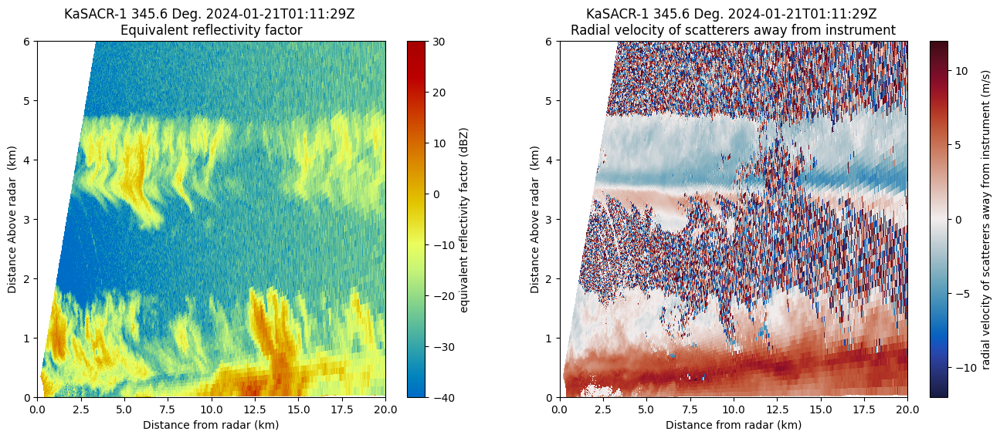

In [47]:
for file in rhi_files:
    radar = pyart.io.read(file)
    fig = plt.figure(figsize=(16, 6))

    # Plot reflectivity
    ax1 = plt.subplot(121)
    display = pyart.graph.RadarDisplay(radar)
    display.plot("reflectivity", sweep=0, vmin=-40, vmax=30, ax=ax1)
    plt.ylim(0, 6)
    plt.xlim(0, 20)

    # Plot velocity
    ax2 = plt.subplot(122)
    display = pyart.graph.RadarDisplay(radar)
    display.plot(
        "mean_doppler_velocity",
        sweep=0,
        vmin=-12,
        vmax=12,
        ax=ax2,
        cmap="pyart_balance",
    )
    plt.ylim(0, 6)
    plt.xlim(0, 20)
    plt.show()
    plt.close()

### Apply Corrections to the Velocity Data

We notice a couple key data quality issues - mainly:
- Noise in regions with clear-air returns (random velocity values)
- Ground clutter where reflectivity values are lower, and velocities are around 0 (noticable near the ground ~2 km from the radar)

The signal to noise ratio (SNR) value will help us mask out these regions!

#### Explore a Threshold for SNR
Let's explore a threshold to use for signal to noise ratio. We can start with an initial plot of the data, side by side with reflectivity.

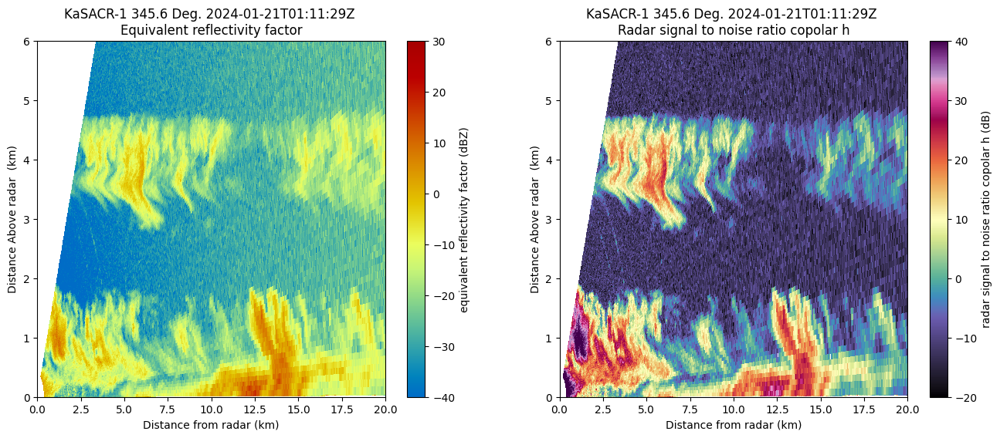

In [31]:
radar = pyart.io.read(file)
fig = plt.figure(figsize=(16, 6))

# Plot reflectivity
ax1 = plt.subplot(121)
display = pyart.graph.RadarDisplay(radar)
display.plot("reflectivity", sweep=0, vmin=-40, vmax=30, ax=ax1)
plt.ylim(0, 6)
plt.xlim(0, 20)

# Plot velocity
ax2 = plt.subplot(122)
display = pyart.graph.RadarDisplay(radar)
display.plot(
    "signal_to_noise_ratio_copolar_h",
    sweep=0,
    vmin=-20,
    vmax=40,
    ax=ax2,
    cmap="pyart_ChaseSpectral",
)
plt.ylim(0, 6)
plt.xlim(0, 20)
plt.show()
plt.close()

It appears there are clear differences in the clear-air regions, and where we have scatterers. Looking at the panel on the right, we notice that there is a break ~-10 to 10 that we could use as a potential threshold. Let's try out -10 to 10 as possible threshold values, masking values less than our threshold value, giving us just the region we are interested in visualizing.

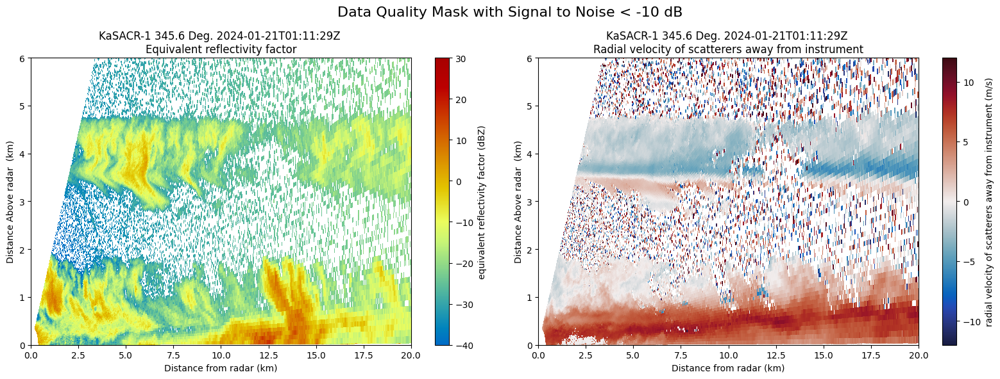

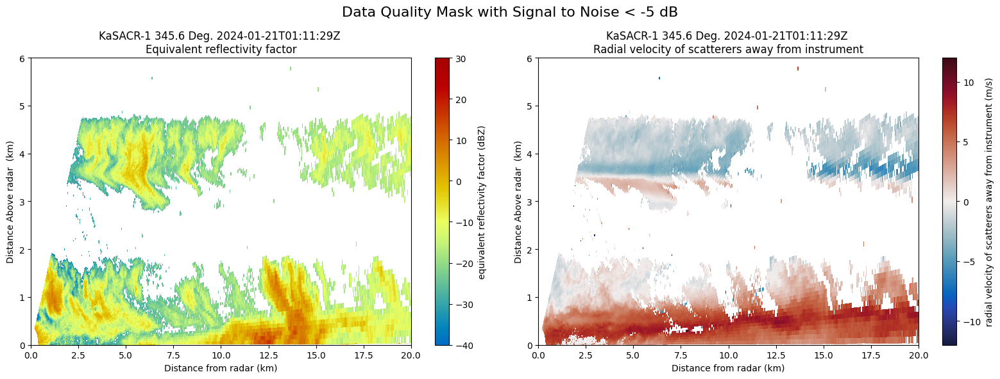

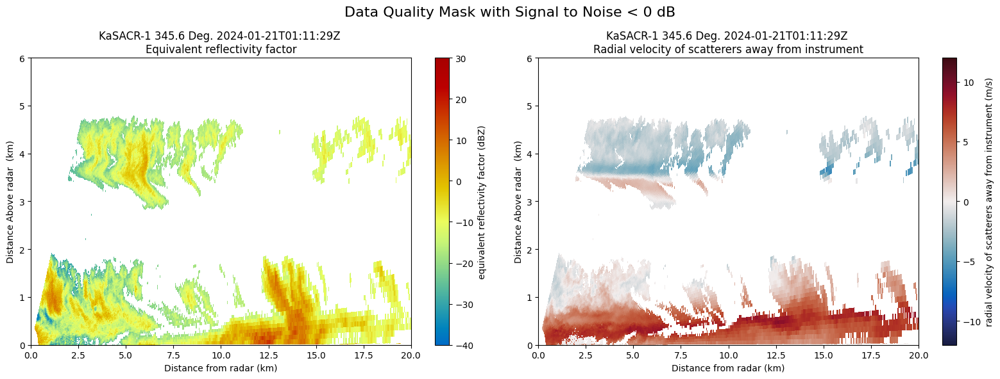

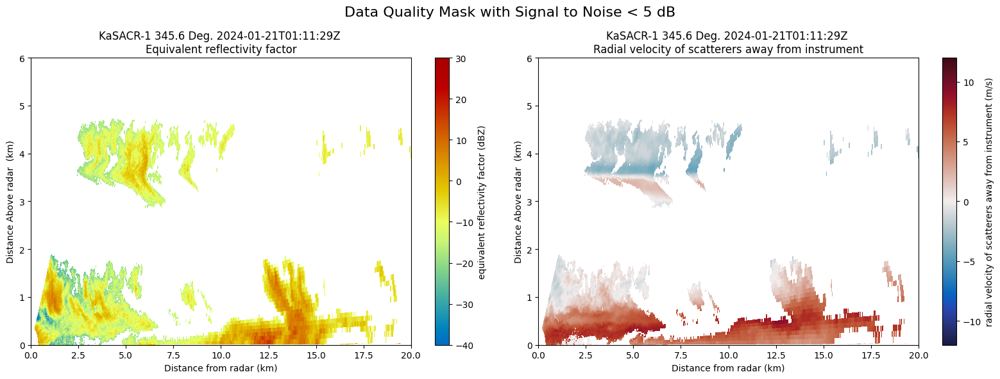

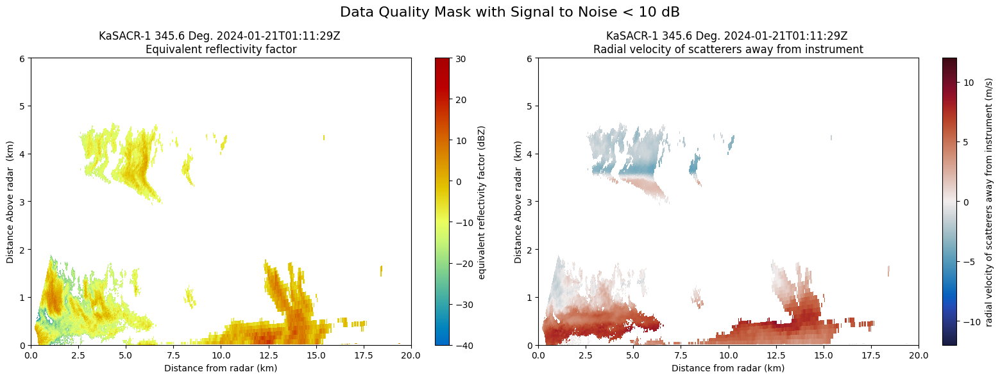

In [48]:
# Define possible SNR threshold values
threshold = np.arange(-10, 15, 5)

for threshold_value in threshold:
    # Mask the data using the gatefilter
    gatefilter = pyart.filters.GateFilter(radar)
    gatefilter.exclude_below("signal_to_noise_ratio_copolar_h", threshold_value)

    # Plot the figure
    fig = plt.figure(figsize=(16, 6))

    # Plot reflectivity
    ax1 = plt.subplot(121)
    display = pyart.graph.RadarDisplay(radar)
    display.plot(
        "reflectivity", sweep=0, vmin=-40, vmax=30, gatefilter=gatefilter, ax=ax1
    )
    plt.ylim(0, 6)
    plt.xlim(0, 20)

    # Plot velocity
    ax2 = plt.subplot(122)
    display = pyart.graph.RadarDisplay(radar)
    display.plot(
        "mean_doppler_velocity",
        sweep=0,
        vmin=-12,
        vmax=12,
        gatefilter=gatefilter,
        ax=ax2,
        cmap="pyart_balance",
    )
    plt.ylim(0, 6)
    plt.xlim(0, 20)
    plt.suptitle(
        f"Data Quality Mask with Signal to Noise < {threshold_value} dB", fontsize=16
    )
    plt.tight_layout()
    plt.show()
    plt.close()

Higher thresholds of minimum SNR value remove too much of the data - especially further from the radar. Let's go with `SNR < -5` as our data quality threshold, as that still preserves the cloud structures, while removing noise from the data.

In [51]:
gatefilter = pyart.filters.GateFilter(radar)
gatefilter.exclude_below("signal_to_noise_ratio_copolar_h", -5)

#### Plot our Revised, Cleaned Data
Now that we have a threshold value, let's plot it!

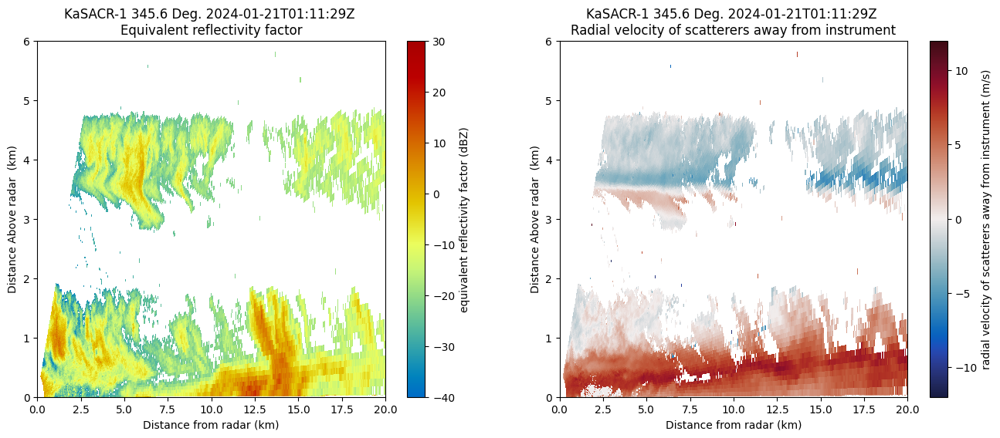

In [52]:
radar = pyart.io.read(file)
fig = plt.figure(figsize=(16, 6))

# Plot reflectivity
ax1 = plt.subplot(121)
display = pyart.graph.RadarDisplay(radar)
display.plot("reflectivity", sweep=0, vmin=-40, vmax=30, gatefilter=gatefilter, ax=ax1)
plt.ylim(0, 6)
plt.xlim(0, 20)

# Plot velocity
ax2 = plt.subplot(122)
display = pyart.graph.RadarDisplay(radar)
display.plot(
    "mean_doppler_velocity",
    sweep=0,
    vmin=-12,
    vmax=12,
    gatefilter=gatefilter,
    ax=ax2,
    cmap="pyart_balance",
)
plt.ylim(0, 6)
plt.xlim(0, 20)
plt.show()
plt.close()

And we can apply this to the remainder of the volume scans!

/Users/mgrover/mambaforge/envs/pyart-dev/lib/python3.11/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


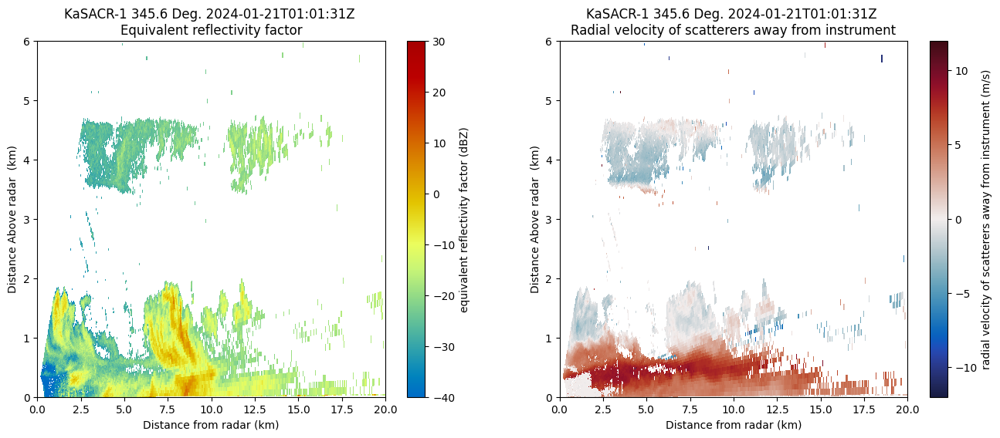

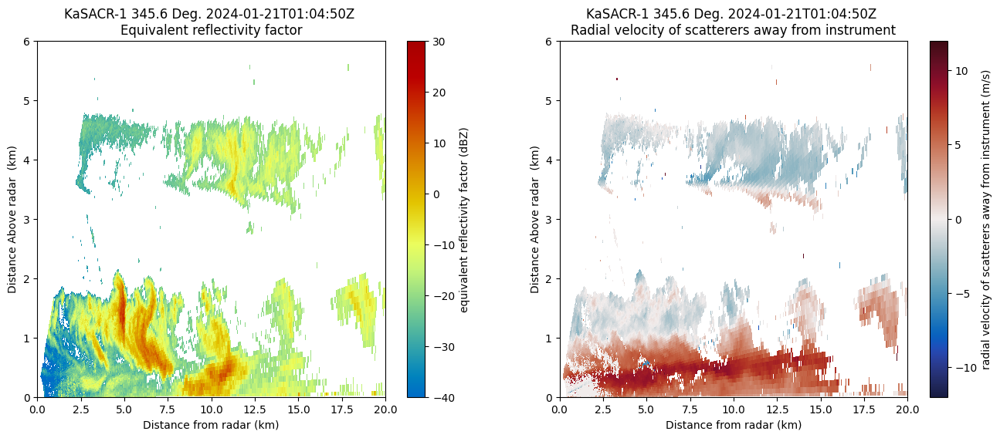

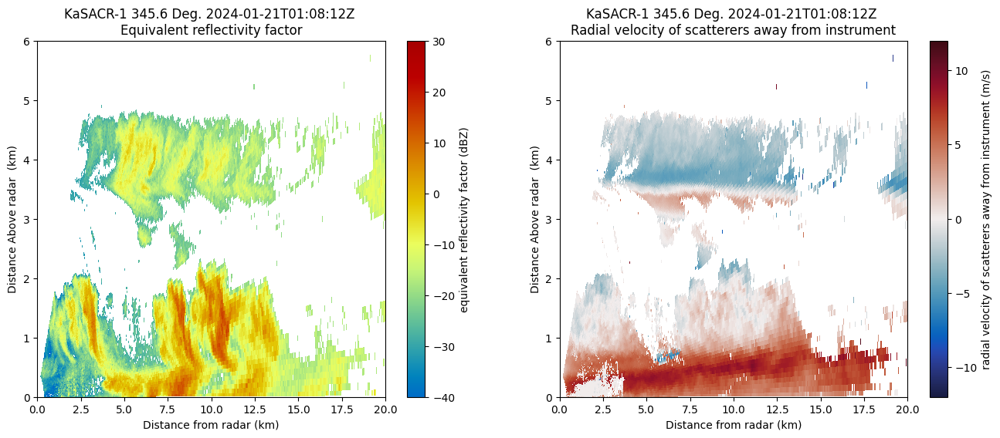

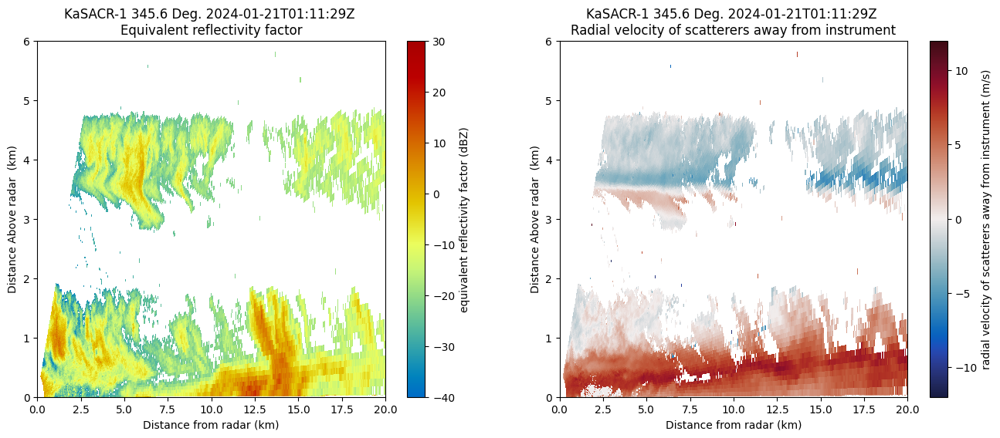

In [59]:
for file in rhi_files:
    radar = pyart.io.read(file)

    # Apply our data quality flag
    gatefilter = pyart.filters.GateFilter(radar)
    gatefilter.exclude_below("signal_to_noise_ratio_copolar_h", -5)

    fig = plt.figure(figsize=(16, 6))

    # Plot reflectivity
    ax1 = plt.subplot(121)
    display = pyart.graph.RadarDisplay(radar)
    display.plot(
        "reflectivity", sweep=0, vmin=-40, vmax=30, gatefilter=gatefilter, ax=ax1
    )
    plt.ylim(0, 6)
    plt.xlim(0, 20)

    # Plot velocity
    ax2 = plt.subplot(122)
    display = pyart.graph.RadarDisplay(radar)
    display.plot(
        "mean_doppler_velocity",
        sweep=0,
        vmin=-12,
        vmax=12,
        gatefilter=gatefilter,
        ax=ax2,
        cmap="pyart_balance",
    )
    plt.ylim(0, 6)
    plt.xlim(0, 20)
    plt.show()
    plt.close()

#### Plot where the RHI scan is slicing through using the PPI for a frame of reference
To give us a better idea of where we are slicing through the clouds, let's plot up the the RHI latitude/longitude, as well as the two PPI scans valid for this 0100 to 0115 UTC time period.

/Users/mgrover/mambaforge/envs/pyart-dev/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


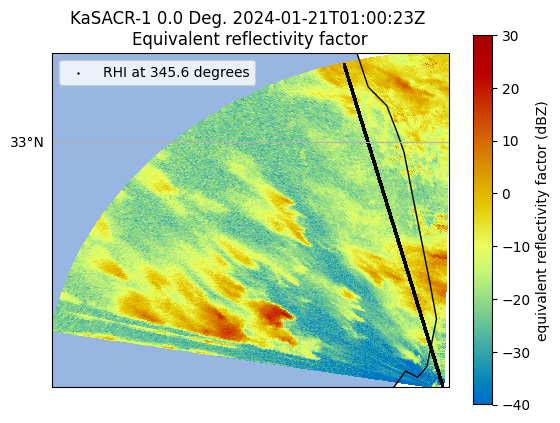

/Users/mgrover/mambaforge/envs/pyart-dev/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


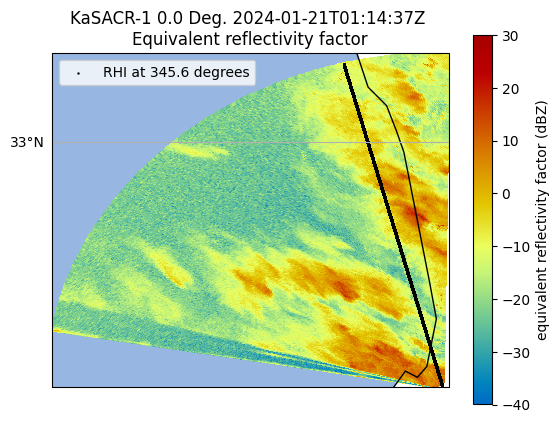

In [103]:
rhi_radar = pyart.io.read(rhi_files[0])
lat, lon, alt = rhi_radar.get_gate_lat_lon_alt(0)

for ppi_file in ppi_files[0:2]:
    ppi_radar = pyart.io.read(ppi_file)
    ax = plt.subplot(111, projection=ccrs.PlateCarree())
    display = pyart.graph.RadarMapDisplay(ppi_radar)
    display.plot_ppi_map(
        "reflectivity",
        sweep=0,
        vmin=-40,
        vmax=30,
        ax=ax,
        resolution="10m",
        projection=ccrs.PlateCarree(),
    )
    ax.scatter(
        lon,
        lat,
        s=0.5,
        label=f'RHI at {round(float(rhi_radar.fixed_angle["data"][0]), 2)} degrees',
        color="k",
    )

    ax.add_feature(cfeature.OCEAN)

    plt.legend(loc="upper left")
    plt.show()
    plt.close()

## Conclusions

Within this post, we explored how to view and access field campaign data from ARM's data achive, explore the scan strategies, apply an inital quality control of the data, and visualize a sample case!